##Mask Detection

---
The goal of this challenge is to build a model that can detect whether a person is wearing a mask or not. You would be downloading the data from kaggle and then building you model.


##Getting the Data

We start by getting the data. The data that we want is on kaggle and you can access it through this link: https://www.kaggle.com/omkargurav/face-mask-dataset What you will have to do, is to search for a way that allows you to download the dataset from kaggle directly into google colab (or your google drive). This process would save you the trouble from downloading the dataset locally and then uploading it to use it in colab.

Make sure to upload your kaggle verification json file to authenticate, you can find it in your kaggle created account. 

In [ ]:

#1st step install kaggle
! pip install -q kaggle

# 2nd step upload file that you downloaded from your account on Kaggle which shows your username and password 
from google.colab import files
files.upload()

# step 3: create kaggle folder
! mkdir ~/.kaggle

# step 4: copy json file to the folder created 
! cp kaggle.json ~/.kaggle/

#step 5: Change the permissions of the file to act
! chmod 600 ~/.kaggle/kaggle.json



In [2]:
# step 7 :download your dataset
! kaggle datasets download omkargurav/face-mask-dataset

 87% 142M/163M [00:01<00:00, 125MB/s]
100% 163M/163M [00:01<00:00, 114MB/s]


Once the dataset is downloaded, it is going to be zipped, and in order to use it, you need to unzip it. Here you have the option of unzipping it in the environment or in your google drive.

In [3]:
! unzip face-mask-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/with_mask/with_mask_3297.jpg  
  inflating: data/with_mask/with_mask_3298.jpg  
  inflating: data/with_mask/with_mask_3299.jpg  
  inflating: data/with_mask/with_mask_33.jpg  
  inflating: data/with_mask/with_mask_330.jpg  
  inflating: data/with_mask/with_mask_3300.jpg  
  inflating: data/with_mask/with_mask_3301.jpg  
  inflating: data/with_mask/with_mask_3302.jpg  
  inflating: data/with_mask/with_mask_3303.jpg  
  inflating: data/with_mask/with_mask_3304.jpg  
  inflating: data/with_mask/with_mask_3305.jpg  
  inflating: data/with_mask/with_mask_3306.jpg  
  inflating: data/with_mask/with_mask_3307.jpg  
  inflating: data/with_mask/with_mask_3308.jpg  
  inflating: data/with_mask/with_mask_3309.jpg  
  inflating: data/with_mask/with_mask_331.jpg  
  inflating: data/with_mask/with_mask_3310.jpg  
  inflating: data/with_mask/with_mask_3311.jpg  
  inflating: data/with_mask/with_mask_3312.jpg  
  inflating: data/with

##Importing the Libraries

Now, it is time to import the libraries that we need. 

In [4]:
import os
import shutil
import random
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
import cv2

If we look at the data that we extracted, we can see that it is located in 2 folders: with_mask and without_mask. What we need to do now, is to create a hierarchy of folders that would help us specify the training, validation, and testing data. In order to do this you have to use the **os** and the **shutil** libraries that would help you creating folders, and moving images from a folder to another. In simple terms, the libraries helps you perform the same things that you do on your computer with your operating system, but in a programmatic way.

The initial dataset contains a lot of images belonging to the 2 classes, what we will do is randomly sample from this dataset so that we reduce the training and the tuning time. 

We need to have in our final directories the following:
* Training: 500 images "with_mask", and 500 images "without_mask"
* Validation: 100 images "with_mask", and 100 images "without_mask"
* Testing: 50 images "with_mask", and 50 images "without_mask"

In [5]:
#Test Your Zaka --- Create the Train, Validation and Testing Folder

!if [ -d '/content/data/train' ]; then echo "Directory train already exist" ; else mkdir '/content/data/train' && echo "Directory train created"; fi
!if [ -d '/content/data/test' ]; then echo "Directory test already exist" ; else mkdir '/content/data/test' && echo "Directory test created"; fi
!if [ -d '/content/data/valid' ]; then echo "Directory valid already exist" ; else mkdir '/content/data/valid' && echo "Directory valid created"; fi

Directory train created
Directory test created
Directory valid created


In [6]:
#Test Your Zaka --- Create the classes folders inside of each folder you created above

# Train Sub-Folders
!if [ -d '/content/data/train/with_mask' ]; then echo "Directory train/with_mask already exist" ; else mkdir '/content/data/train/with_mask' && echo "Directory train/with_mask created"; fi
!if [ -d '/content/data/train/without_mask' ]; then echo "Directory train/without_mask already exist" ; else mkdir '/content/data/train/without_mask' && echo "Directory train/without_mask created"; fi

# Valid Sub-Folders
!if [ -d '/content/data/valid/with_mask' ]; then echo "Directory valid/with_mask already exist" ; else mkdir '/content/data/valid/with_mask' && echo "Directory valid/with_mask created"; fi
!if [ -d '/content/data/valid/without_mask' ]; then echo "Directory valid/without_mask already exist" ; else mkdir '/content/data/valid/without_mask' && echo "Directory valid/without_mask created"; fi

# Test Sub-Folders
!if [ -d '/content/data/test/with_mask' ]; then echo "Directory test/with_mask already exist" ; else mkdir '/content/data/test/with_mask' && echo "Directory test/with_mask created"; fi
!if [ -d '/content/data/test/without_mask' ]; then echo "Directory test/without_mask already exist" ; else mkdir '/content/data/test/without_mask' && echo "Directory test/without_mask created"; fi



Directory train/with_mask created
Directory train/without_mask created
Directory valid/with_mask created
Directory valid/without_mask created
Directory test/with_mask created
Directory test/without_mask created


In [7]:
def setting_sets(mask_dest_path,wmask_dest_path,images_nb):

  mask_path='/content/data/with_mask'
  wmask_path='/content/data/without_mask'

  ## Train Creation
  mask_size=len(os.listdir(mask_path))
  wmask_size=len(os.listdir(wmask_path))

  mask_sample=np.random.choice(mask_size,replace=False,size=images_nb)
  wmask_sample=np.random.choice(wmask_size,replace=False,size=images_nb)

  mask_samples=np.array(os.listdir(mask_path))[mask_sample.astype(int)]
  wmask_samples=np.array(os.listdir(wmask_path))[wmask_sample.astype(int)]

  for file in mask_samples:
      shutil.move(f'{mask_path}/{file}',mask_dest_path)

  for file in wmask_samples:
      shutil.move(f'{wmask_path}/{file}',wmask_dest_path)

# Training set for with_mask and witout_mask
setting_sets('/content/data/train/with_mask','/content/data/train/without_mask',500)

# Validation set for with_mask and witout_mask
setting_sets('/content/data/valid/with_mask','/content/data/valid/without_mask',100)

# Testing set for with_mask and witout_mask
setting_sets('/content/data/test/with_mask','/content/data/test/without_mask',50)

In [8]:
print(len(os.listdir('/content/data/train/with_mask')))
print(len(os.listdir('/content/data/train/without_mask')))

print(len(os.listdir('/content/data/valid/with_mask')))
print(len(os.listdir('/content/data/valid/without_mask')))

print(len(os.listdir('/content/data/test/with_mask')))
print(len(os.listdir('/content/data/test/without_mask')))

500
500
100
100
50
50


##Inspecting the Dataset

Now we will see some characteristics of our dataset.

Define 3 variables: **training_path**, **validation_path**, and **testing_path** so that you can use them for the rest of the colab.

In [9]:
#Test Your Zaka
training_path='/content/data/train'
validation_path='/content/data/valid'
testing_path='/content/data/test'

To make sure that everythinh went correctly, write a code that counts the number of images that you have in your training directory for each of the 2 categories: with_mask and without_mask

In [10]:
#Test Your Zaka
print(f"We have {len(os.listdir(training_path+'/with_mask'))} images with_mask and {len(os.listdir(training_path+'/without_mask'))} images without mask in the training set")


We have 500 images with_mask and 500 images without mask in the training set


Do the same for the validation and the testing folders

In [11]:
#Test Your Zaka

print(f"We have {len(os.listdir(validation_path+'/with_mask'))} images with_mask and {len(os.listdir(validation_path+'/without_mask'))} images without mask in the validation set")

We have 100 images with_mask and 100 images without mask in the validation set


In [12]:
#Test Your Zaka
print(f"We have {len(os.listdir(testing_path+'/with_mask'))} images with_mask and {len(os.listdir(testing_path+'/without_mask'))} images without mask in the testing set")

We have 50 images with_mask and 50 images without mask in the testing set


Write a code that shows 5 random images for people with mask from your training set. 

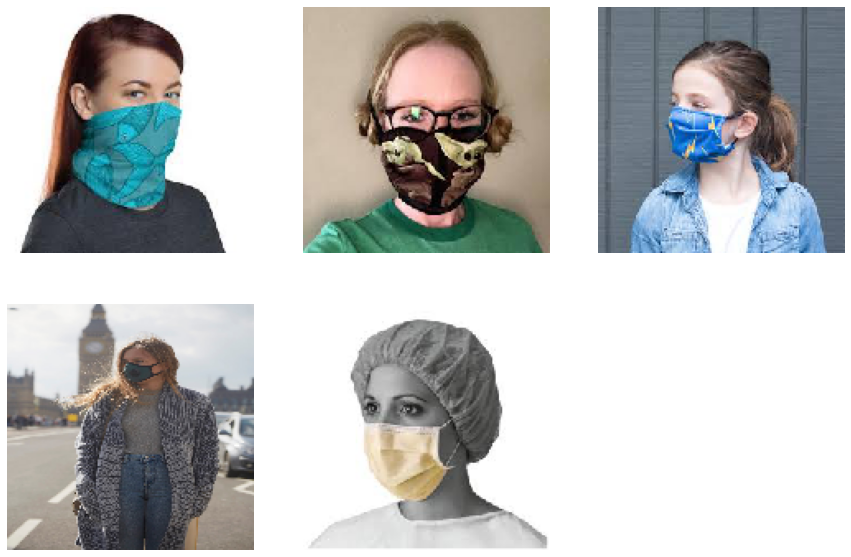

In [13]:
#Test Your Zaka
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
from google.colab.patches import cv2_imshow


def random_images(n, path):
  plt.figure(figsize=(15,10))
  for i in range(n):
    plt.subplot(230 + 1+i)
    image=os.listdir(path)[i]
    img = load_img(path+'/'+image,color_mode='rgb', target_size=(150,150))
    plt.axis('off')
    plt.imshow(img)

random_images(5,training_path+'/with_mask')

Do the same for people without mask.

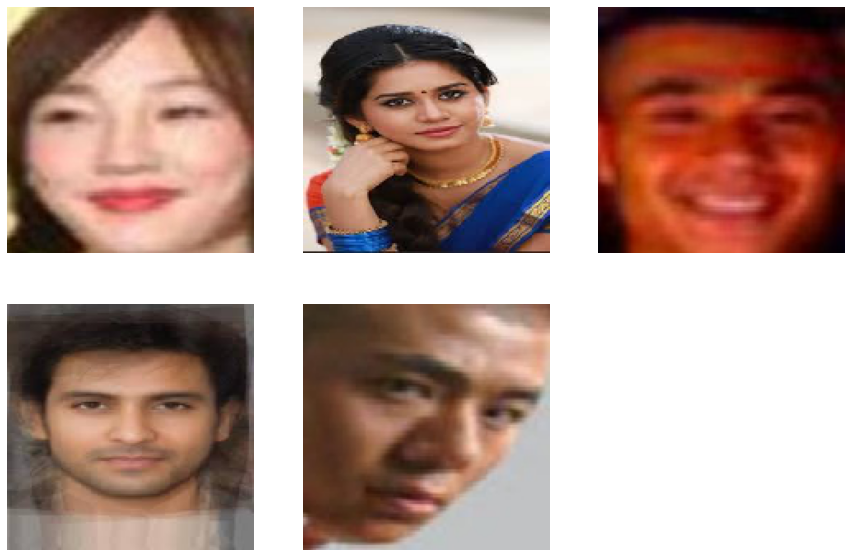

In [14]:
#Test Your Zaka
random_images(5,training_path+'/without_mask')

##Modeling

Define a model structure that can deal with the images that we have to classify them between the 2 classes.

In [17]:
#Test Your Zaka

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, AveragePooling2D, Flatten, Dropout

# create generator (normalization, pixel_centering, )
datagen = ImageDataGenerator(rescale=1.0/255.0,vertical_flip=True, rotation_range=45,brightness_range=[0.4, 1.5])

train_iter=datagen.flow_from_directory(training_path, class_mode="binary",batch_size=20, target_size=(256,256))
test_iter=datagen.flow_from_directory(testing_path, class_mode="binary",batch_size=10, target_size=(256,256), shuffle=False)
validation_iter=datagen.flow_from_directory(validation_path, class_mode="binary",batch_size=10, target_size=(256,256))


Found 1000 images belonging to 2 classes.
Found 100 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


In [21]:
model=Sequential()
model.add(Conv2D(filters=16, kernel_size=(3,3),activation='relu',padding='same',input_shape=(256,256,3)))
model.add(AveragePooling2D(2,2))
model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
model.add(AveragePooling2D(2,2))
model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model.add(AveragePooling2D(2,2))
model.add(Flatten())
model.add(Dense(64,activation='relu'))
model.add(Dense(1,activation='sigmoid'))


model.summary()

model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy","Recall"])


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 256, 256, 16)      448       
                                                                 
 average_pooling2d_3 (Averag  (None, 128, 128, 16)     0         
 ePooling2D)                                                     
                                                                 
 conv2d_4 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 average_pooling2d_4 (Averag  (None, 64, 64, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 average_pooling2d_5 (Averag  (None, 32, 32, 64)      

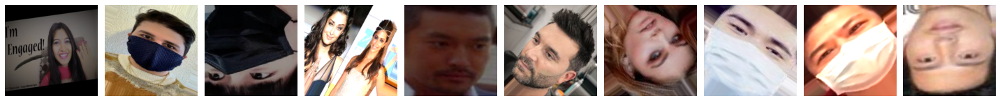

[1. 0. 0. 1. 1. 1. 1. 0. 0. 1.]


In [19]:
## to see the operations made on images to be trained
from IPython.core.pylabtools import figsize
train_images, train_labels=next(train_iter)

def PlotImages(images):
  fig,axes=plt.subplots(1,10,figsize=(20,20))
  axes=axes.flatten()
  for img, ax in zip(images,axes):
    ax.imshow(img)
    ax.axis('off')
    
  plt.tight_layout()
  plt.show()

PlotImages(train_images)
print(train_labels[:10])

Train the model that you defined on the training data and evaluate it on the validation data. Feel free to tune the hyperparameters of your model until you reach a satisfying result on the validation set. </br>
**N.B:** Make sure to save the model training history in a variable to plot later the learning curve.

In [22]:
#Test Your Zaka
history=model.fit(train_iter,validation_data=validation_iter,steps_per_epoch=50,epochs=10,validation_steps=20)
# (training_images = batch_size * steps_per_epoch)
# (validation_images = batch_size* validation_steps)

#model.save('Mask_Detection_model.h5') 
print(history.history.keys())

Epoch 1/10
50/50 [==============================] - 25s 453ms/step - loss: 0.7848 - accuracy: 0.5210 - recall: 0.3060 - val_loss: 0.6690 - val_accuracy: 0.7400 - val_recall: 0.7000
Epoch 2/10
50/50 [==============================] - 20s 407ms/step - loss: 0.6097 - accuracy: 0.6880 - recall: 0.6660 - val_loss: 0.4264 - val_accuracy: 0.8400 - val_recall: 0.8200
Epoch 3/10
50/50 [==============================] - 20s 405ms/step - loss: 0.5242 - accuracy: 0.7580 - recall: 0.7780 - val_loss: 0.4363 - val_accuracy: 0.8450 - val_recall: 0.8300
Epoch 4/10
50/50 [==============================] - 20s 406ms/step - loss: 0.4920 - accuracy: 0.7770 - recall: 0.8220 - val_loss: 0.4495 - val_accuracy: 0.7850 - val_recall: 0.9700
Epoch 5/10
50/50 [==============================] - 20s 411ms/step - loss: 0.4917 - accuracy: 0.7690 - recall: 0.7920 - val_loss: 0.5578 - val_accuracy: 0.6700 - val_recall: 0.3700
Epoch 6/10
50/50 [==============================] - 20s 406ms/step - loss: 0.4857 - accuracy: 0

Plot the accuracy curve and see if your model is overfit.

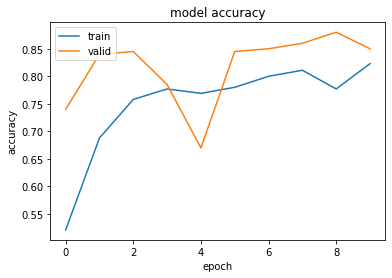

In [23]:
#Test Your Zaka
# summarize history for training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

The model is not overfit

##Evaluate the model


Now you will evaluate the model that you built on the testing set that you kept aside since the beginning.

In [24]:
#Test Your Zaka
pred=model.predict(test_iter)

Now we want to visualize the confusion matrix in order to see how much our classifier is good in predicting different classes.

True Negative: 44 
False Positive: 6 
False Negative: 11 
True Positive: 39


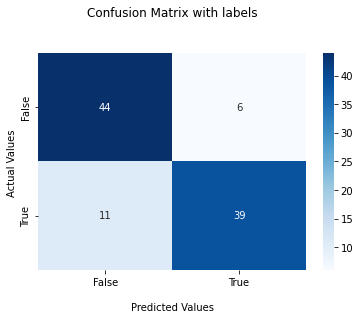

Cases of true positive (39) < Cases of true negative (44)
--> Predicting Class 0 (Mask) less than Predicting Class 1 (No Mask)


In [25]:
#Test Your Zaka
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
import seaborn as sns

test_labels=test_iter.labels # [0,1]-->[mask,no_mask]

pred=np.round(pred)
pred=pred.reshape(1,100)[0]

conf_mat=confusion_matrix(test_labels,pred)
#TN, FP, FN, TP = confusion_matrix(test_labels,pred).ravel()
TN, FP, FN, TP = conf_mat.ravel()

print(f"True Negative: {TN} \nFalse Positive: {FP} \nFalse Negative: {FN} \nTrue Positive: {TP}" )

ax = sns.heatmap(conf_mat, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

print(f"Cases of true positive ({TP}) < Cases of true negative ({TN})")
print("--> Predicting Class 0 (Mask) less than Predicting Class 1 (No Mask)")

**What did you learn about your model from this confusion matrix?**

The model performs well, but it recognizes the class 0 better than it recognizes class 1.

##Error Analysis

Now we need to see for each of the images that we have in our testing set, what did the model predict. This helps us analyze the errors and try to think why the model predicted some things in the wrong way.

Found 100 images belonging to 2 classes.
Correct Classification: Predicted class (0.0) == Actual class (0)


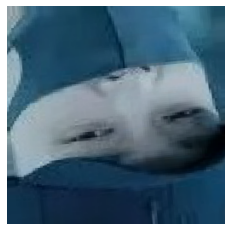

Correct Classification: Predicted class (0.0) == Actual class (0)


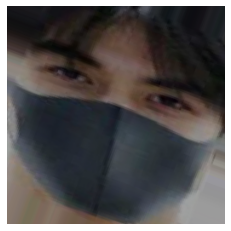

Correct Classification: Predicted class (0.0) == Actual class (0)


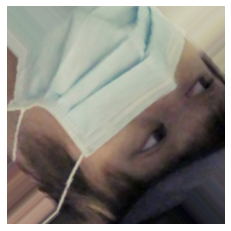

Correct Classification: Predicted class (0.0) == Actual class (0)


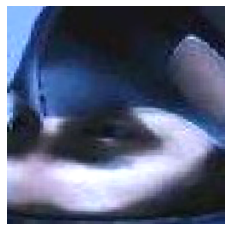

Wrong Classification: Predicted class (1.0) != Actual class (0)


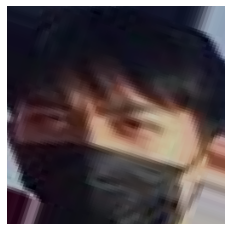

Correct Classification: Predicted class (0.0) == Actual class (0)


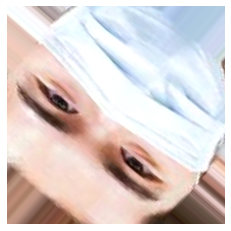

Wrong Classification: Predicted class (1.0) != Actual class (0)


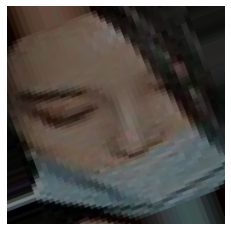

Wrong Classification: Predicted class (1.0) != Actual class (0)


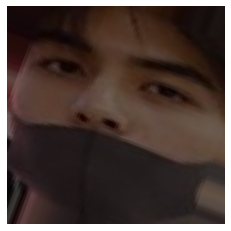

Correct Classification: Predicted class (0.0) == Actual class (0)


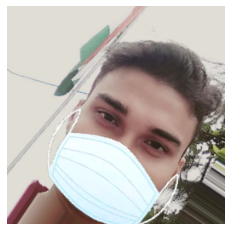

Correct Classification: Predicted class (0.0) == Actual class (0)


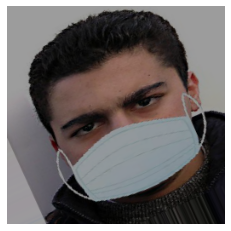

Correct Classification: Predicted class (0.0) == Actual class (0)


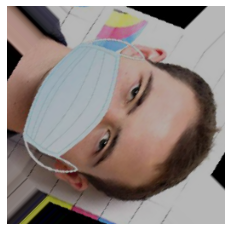

Correct Classification: Predicted class (0.0) == Actual class (0)


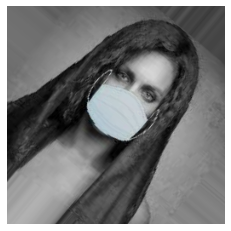

Correct Classification: Predicted class (0.0) == Actual class (0)


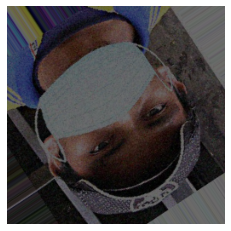

Correct Classification: Predicted class (0.0) == Actual class (0)


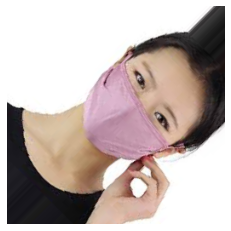

Correct Classification: Predicted class (0.0) == Actual class (0)


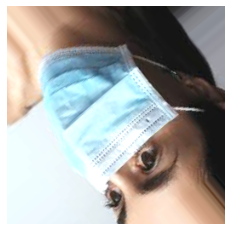

Correct Classification: Predicted class (0.0) == Actual class (0)


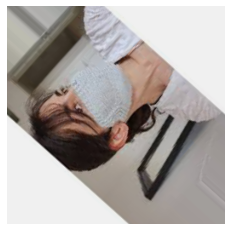

Correct Classification: Predicted class (0.0) == Actual class (0)


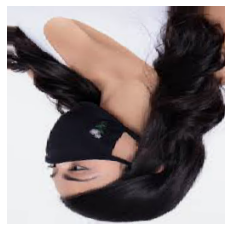

Correct Classification: Predicted class (0.0) == Actual class (0)


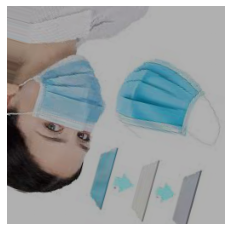

Wrong Classification: Predicted class (1.0) != Actual class (0)


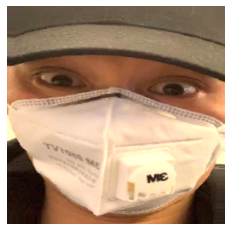

Correct Classification: Predicted class (0.0) == Actual class (0)


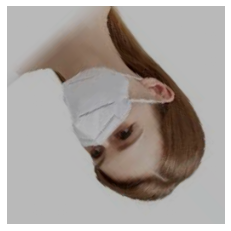

Correct Classification: Predicted class (0.0) == Actual class (0)


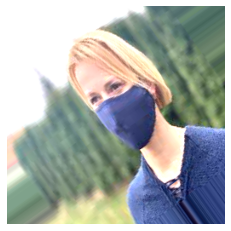

Correct Classification: Predicted class (0.0) == Actual class (0)


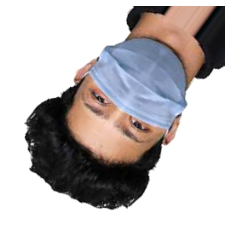

Correct Classification: Predicted class (0.0) == Actual class (0)


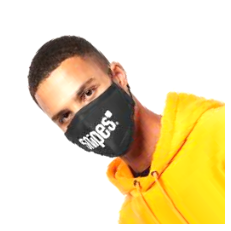

Correct Classification: Predicted class (0.0) == Actual class (0)


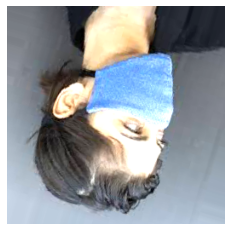

Correct Classification: Predicted class (0.0) == Actual class (0)


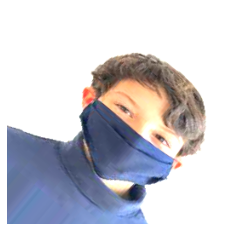

Correct Classification: Predicted class (0.0) == Actual class (0)


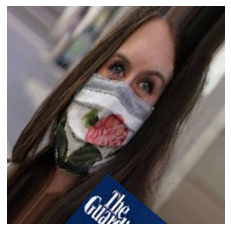

Correct Classification: Predicted class (0.0) == Actual class (0)


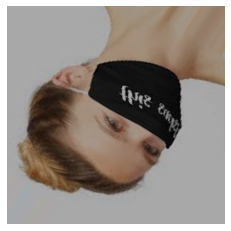

Correct Classification: Predicted class (0.0) == Actual class (0)


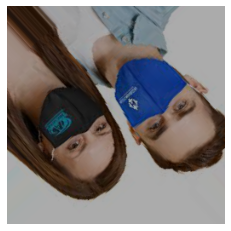

Correct Classification: Predicted class (0.0) == Actual class (0)


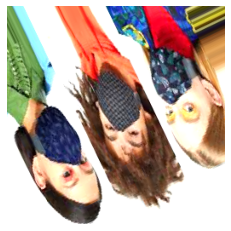

Correct Classification: Predicted class (0.0) == Actual class (0)


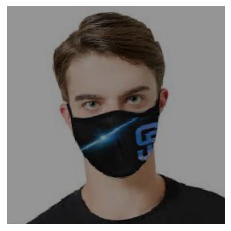

Correct Classification: Predicted class (0.0) == Actual class (0)


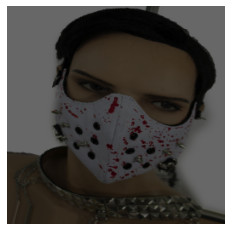

Correct Classification: Predicted class (0.0) == Actual class (0)


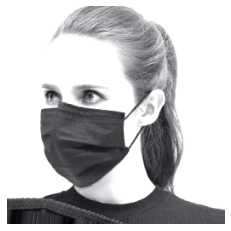

Correct Classification: Predicted class (0.0) == Actual class (0)


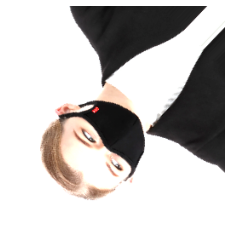

Correct Classification: Predicted class (0.0) == Actual class (0)


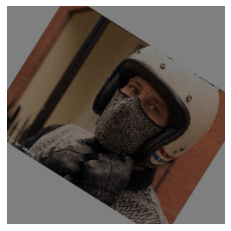

Wrong Classification: Predicted class (1.0) != Actual class (0)


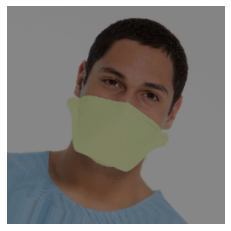

Correct Classification: Predicted class (0.0) == Actual class (0)


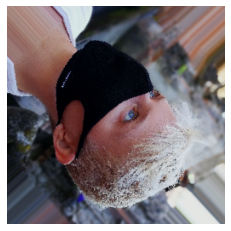

Correct Classification: Predicted class (0.0) == Actual class (0)


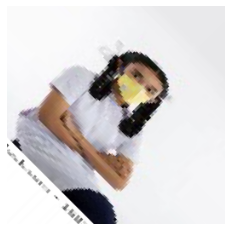

Correct Classification: Predicted class (0.0) == Actual class (0)


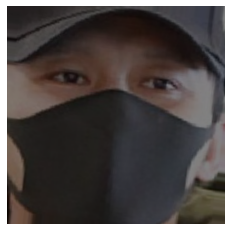

Wrong Classification: Predicted class (1.0) != Actual class (0)


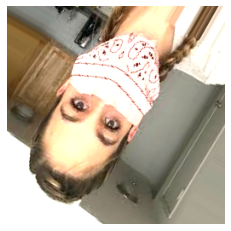

Correct Classification: Predicted class (0.0) == Actual class (0)


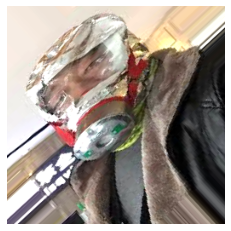

Correct Classification: Predicted class (0.0) == Actual class (0)


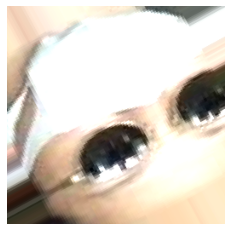

Correct Classification: Predicted class (0.0) == Actual class (0)


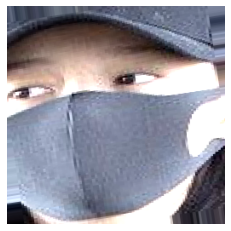

Correct Classification: Predicted class (0.0) == Actual class (0)


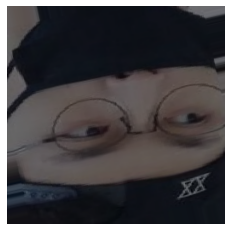

Correct Classification: Predicted class (0.0) == Actual class (0)


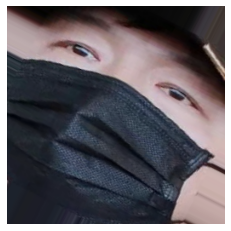

Correct Classification: Predicted class (0.0) == Actual class (0)


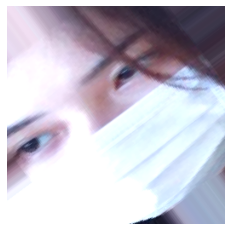

Correct Classification: Predicted class (0.0) == Actual class (0)


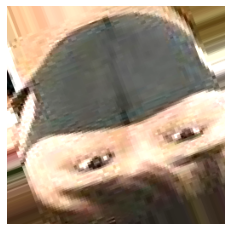

Correct Classification: Predicted class (0.0) == Actual class (0)


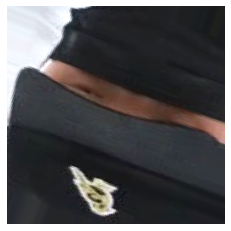

Correct Classification: Predicted class (0.0) == Actual class (0)


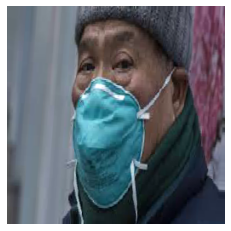

Correct Classification: Predicted class (0.0) == Actual class (0)


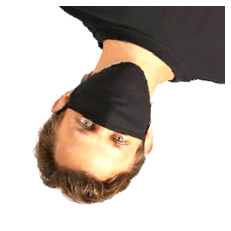

Correct Classification: Predicted class (0.0) == Actual class (0)


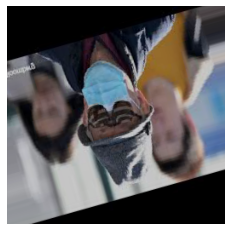

Correct Classification: Predicted class (1.0) == Actual class (1)


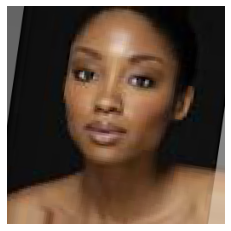

Correct Classification: Predicted class (1.0) == Actual class (1)


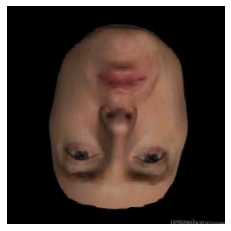

Correct Classification: Predicted class (1.0) == Actual class (1)


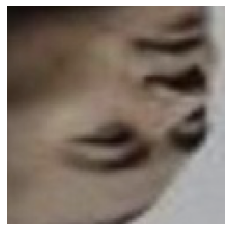

Correct Classification: Predicted class (1.0) == Actual class (1)


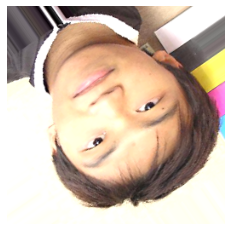

Correct Classification: Predicted class (1.0) == Actual class (1)


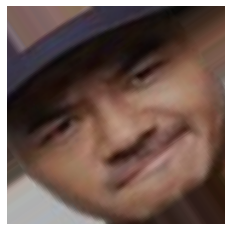

Correct Classification: Predicted class (1.0) == Actual class (1)


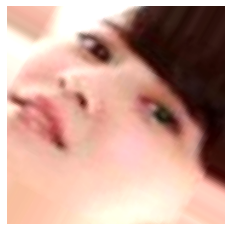

Correct Classification: Predicted class (1.0) == Actual class (1)


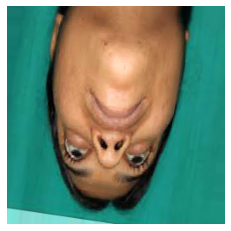

Correct Classification: Predicted class (1.0) == Actual class (1)


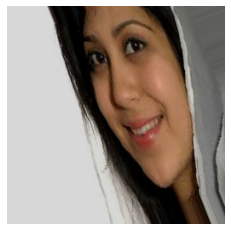

Correct Classification: Predicted class (1.0) == Actual class (1)


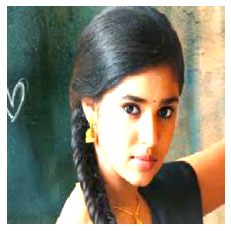

Correct Classification: Predicted class (1.0) == Actual class (1)


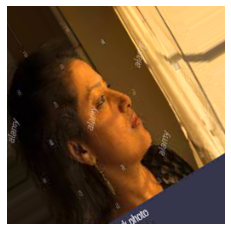

Correct Classification: Predicted class (1.0) == Actual class (1)


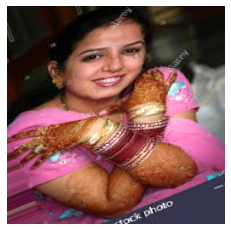

Correct Classification: Predicted class (1.0) == Actual class (1)


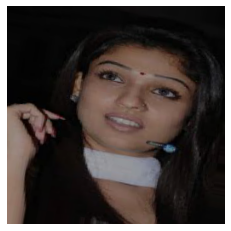

Correct Classification: Predicted class (1.0) == Actual class (1)


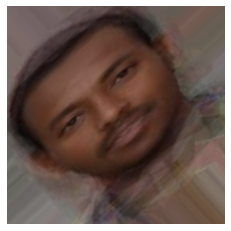

Correct Classification: Predicted class (1.0) == Actual class (1)


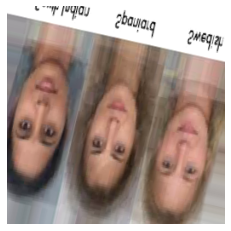

Wrong Classification: Predicted class (0.0) != Actual class (1)


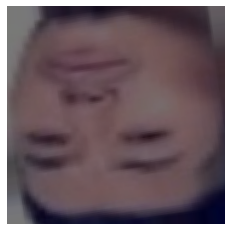

Correct Classification: Predicted class (1.0) == Actual class (1)


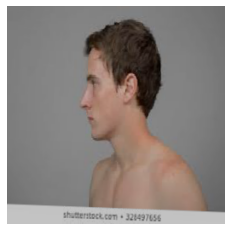

Correct Classification: Predicted class (1.0) == Actual class (1)


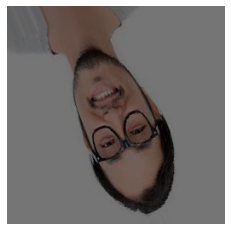

Wrong Classification: Predicted class (0.0) != Actual class (1)


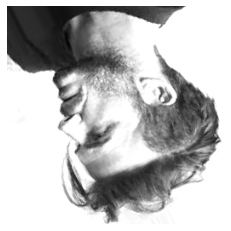

Correct Classification: Predicted class (1.0) == Actual class (1)


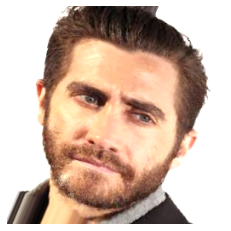

Correct Classification: Predicted class (1.0) == Actual class (1)


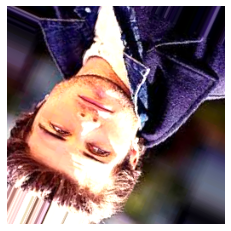

Correct Classification: Predicted class (1.0) == Actual class (1)


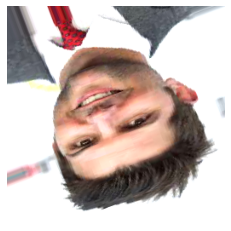

Wrong Classification: Predicted class (0.0) != Actual class (1)


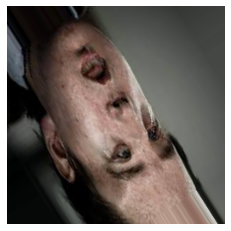

Wrong Classification: Predicted class (0.0) != Actual class (1)


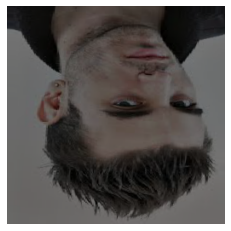

Correct Classification: Predicted class (1.0) == Actual class (1)


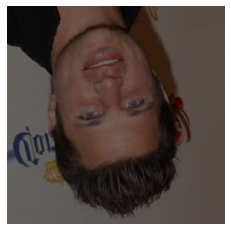

Wrong Classification: Predicted class (0.0) != Actual class (1)


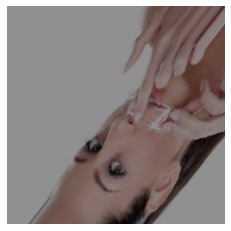

Wrong Classification: Predicted class (0.0) != Actual class (1)


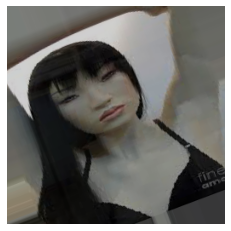

Correct Classification: Predicted class (1.0) == Actual class (1)


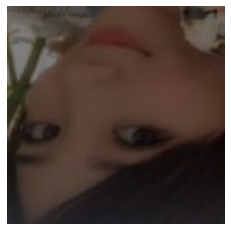

Wrong Classification: Predicted class (0.0) != Actual class (1)


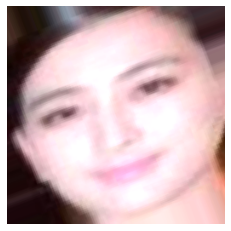

Correct Classification: Predicted class (1.0) == Actual class (1)


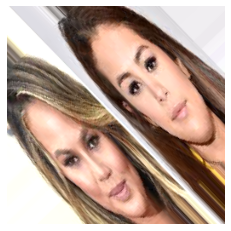

Wrong Classification: Predicted class (0.0) != Actual class (1)


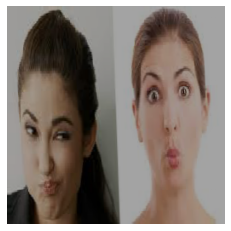

Wrong Classification: Predicted class (0.0) != Actual class (1)


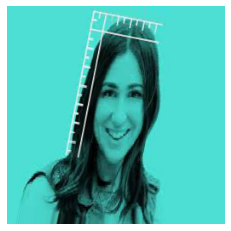

Correct Classification: Predicted class (1.0) == Actual class (1)


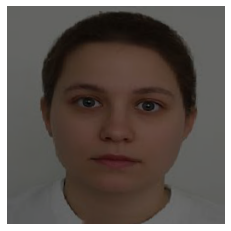

Correct Classification: Predicted class (1.0) == Actual class (1)


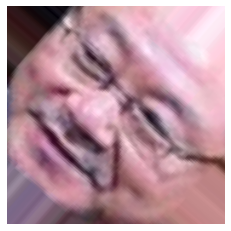

Correct Classification: Predicted class (1.0) == Actual class (1)


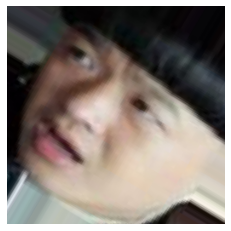

Correct Classification: Predicted class (1.0) == Actual class (1)


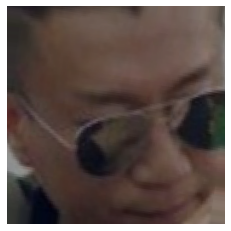

Correct Classification: Predicted class (1.0) == Actual class (1)


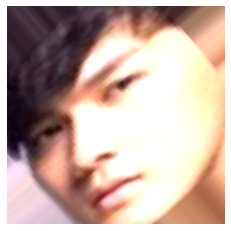

Correct Classification: Predicted class (1.0) == Actual class (1)


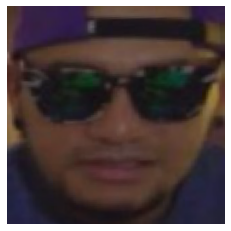

Correct Classification: Predicted class (1.0) == Actual class (1)


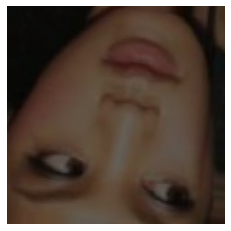

Wrong Classification: Predicted class (0.0) != Actual class (1)


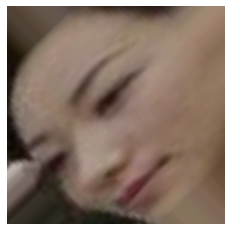

Wrong Classification: Predicted class (0.0) != Actual class (1)


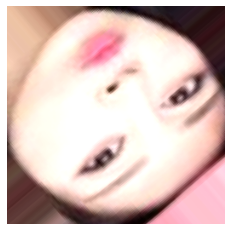

Correct Classification: Predicted class (1.0) == Actual class (1)


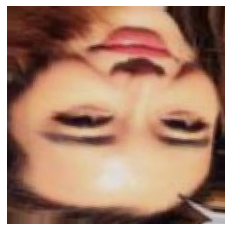

Correct Classification: Predicted class (1.0) == Actual class (1)


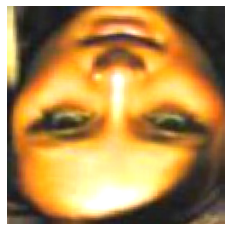

Correct Classification: Predicted class (1.0) == Actual class (1)


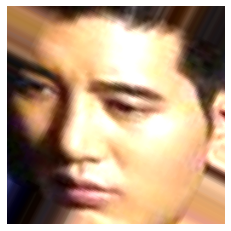

Correct Classification: Predicted class (1.0) == Actual class (1)


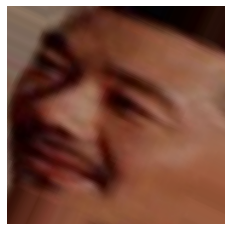

Correct Classification: Predicted class (1.0) == Actual class (1)


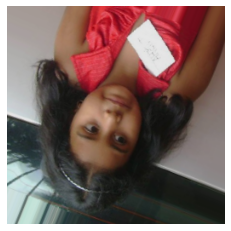

Correct Classification: Predicted class (1.0) == Actual class (1)


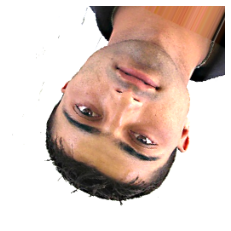

Correct Classification: Predicted class (1.0) == Actual class (1)


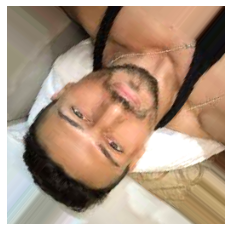

Correct Classification: Predicted class (1.0) == Actual class (1)


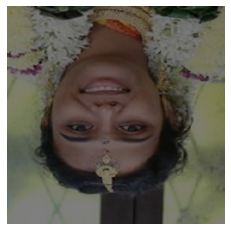

Correct Classification: Predicted class (1.0) == Actual class (1)


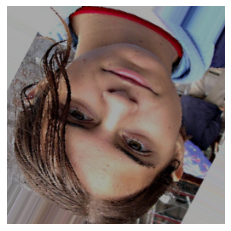

Correct Classification: Predicted class (1.0) == Actual class (1)


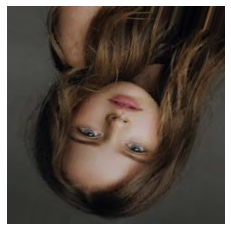

In [26]:
def PlotImages(images, pred, true):
  for ind in range(len(pred)):
    plt.imshow(images[ind])
    plt.axis('off')
    if pred[ind] != true[ind]:
      print(f"Wrong Classification: Predicted class ({pred[ind]}) != Actual class ({true[ind]})")
    else:
      print(f"Correct Classification: Predicted class ({pred[ind]}) == Actual class ({true[ind]})")
    plt.show()

testt_iter=datagen.flow_from_directory(testing_path, class_mode="binary",batch_size=100, target_size=(256,256), shuffle=False)
test_images, testt_labels=next(testt_iter)

PlotImages(test_images, pred,test_labels)

**In order to improve the performance of your model, many methds can be applied:**

* Getting More Data
* Training for longer
* Transfer Learning
* Increasing Model Complexity


**Moving with the 1st method: Getting more data**

In [27]:
# Adding Training set for with_mask and witout_mask
setting_sets('/content/data/train/with_mask','/content/data/train/without_mask',250)

# Adding Validation set for with_mask and witout_mask
setting_sets('/content/data/valid/with_mask','/content/data/valid/without_mask',50)

# Adding Testing set for with_mask and witout_mask
setting_sets('/content/data/test/with_mask','/content/data/test/without_mask',25)


train_iter2=datagen.flow_from_directory(training_path, class_mode="binary",batch_size=20, target_size=(256,256))
test_iter2=datagen.flow_from_directory(testing_path, class_mode="binary",batch_size=10, target_size=(256,256), shuffle=False)
validation_iter2=datagen.flow_from_directory(validation_path, class_mode="binary",batch_size=10, target_size=(256,256))

history2=model.fit(train_iter2,validation_data=validation_iter2,steps_per_epoch=75,epochs=10,validation_steps=25)
# (training_images = batch_size * steps_per_epoch)
# (validation_images = batch_size* validation_steps)

Found 1500 images belonging to 2 classes.
Found 150 images belonging to 2 classes.
Found 300 images belonging to 2 classes.
Epoch 1/10
31/75 [===========>..................] - ETA: 15s - loss: 0.4252 - accuracy: 0.7984 - recall: 0.7957

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


75/75 [==============================] - 31s 416ms/step - loss: 0.4324 - accuracy: 0.7953 - recall: 0.7987 - val_loss: 0.4553 - val_accuracy: 0.7840 - val_recall: 0.7540
Epoch 2/10
75/75 [==============================] - 30s 399ms/step - loss: 0.4463 - accuracy: 0.7927 - recall: 0.7720 - val_loss: 0.2876 - val_accuracy: 0.9000 - val_recall: 0.8226
Epoch 3/10
75/75 [==============================] - 30s 396ms/step - loss: 0.3817 - accuracy: 0.8340 - recall: 0.8133 - val_loss: 0.2881 - val_accuracy: 0.8680 - val_recall: 0.9350
Epoch 4/10
75/75 [==============================] - 30s 396ms/step - loss: 0.3515 - accuracy: 0.8500 - recall: 0.8333 - val_loss: 0.2764 - val_accuracy: 0.8880 - val_recall: 0.8943
Epoch 5/10
75/75 [==============================] - 30s 394ms/step - loss: 0.3456 - accuracy: 0.8473 - recall: 0.8240 - val_loss: 0.2812 - val_accuracy: 0.8960 - val_recall: 0.9070
Epoch 6/10
75/75 [==============================] - 30s 397ms/step - loss: 0.3456 - accuracy: 0.8460 - rec

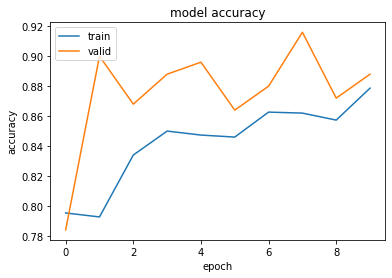

In [28]:
# summarize history for training and validation accuracy
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()